In [1]:
!date

Tue Apr  9 16:05:04 PDT 2019


# Imports

In [2]:
import os
from pathlib import Path
import numpy as np
from IPython.display import display, HTML, Math
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import pybroom as br
from multispot_utils import heatmap48, spotsh, spotsv, info_html

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams['font.sans-serif'].insert(0, 'Arial')
plt.rcParams['path.simplify_threshold'] = 1.0
plt.rcParams['font.size'] = 14

In [4]:
from fretbursts import *

 - Optimized (cython) burst search loaded.
 - Optimized (cython) photon counting loaded.
--------------------------------------------------------------
 You are running FRETBursts (version 0.7+26.g5de603d.dirty).

 If you use this software please cite the following paper:

   FRETBursts: An Open Source Toolkit for Analysis of Freely-Diffusing Single-Molecule FRET
   Ingargiola et al. (2016). http://dx.doi.org/10.1371/journal.pone.0160716 

--------------------------------------------------------------


In [5]:
sns = init_notebook(apionly=True)

In [6]:
plot_timetraces = True
skip_ch = (12, 13)

In [7]:
_plot_status = {}

# Load HDF5 files

In [8]:
mlabels = ['-8TA_-3NTD_500pM_no-flow_0-200s', '-8TA_-3NTD_500pM_Streets_chip_with_flow_0-200s']
mlabels

['-8TA_-3NTD_500pM_no-flow_0-200s',
 '-8TA_-3NTD_500pM_Streets_chip_with_flow_0-200s']

In [9]:
dir_ = Path('.').absolute()
dir_

PosixPath('/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results')

In [10]:
ls $dir_

05_-8TA_-3NTD_500pM.hdf5*
05_-8TA_-3NTD_500pM_cache.hdf5
06_-8TA_-3NTD_500pM_ASchip.hdf5*
06_-8TA_-3NTD_500pM_ASchip_cache.hdf5
README.md
__pycache__/
_config.yml
burst_analysis_for_flow_vs_no-flow_0-200s.ipynb
cal_phrates.py
figures/
metadata/
results/
save_results_for_flow_vs_no-flow_0-200s.ipynb
save_results_for_flow_vs_no-flow_0-200s_v2.ipynb


In [11]:
# sort to have chronological order for repeats
filepaths = sorted([f for f in Path(dir_).glob('*.hdf5') 
                   if 'cache' not in f.stem]) 
fnames = [f.name for f in filepaths]
fnames

['05_-8TA_-3NTD_500pM.hdf5', '06_-8TA_-3NTD_500pM_ASchip.hdf5']

In [12]:
f0 = fnames[0][:19]
f1 = fnames[1][:26]
f0, f1

('05_-8TA_-3NTD_500pM', '06_-8TA_-3NTD_500pM_ASchip')

In [13]:
save_dir = Path('./figures').absolute()
save_dir

PosixPath('/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures')

# Load data

In [14]:
d0 = loader.photon_hdf5(fnames[0]) # no flow
d1 = loader.photon_hdf5(fnames[1]) # with flow

In [15]:
info_html(d0)

In [16]:
info_html(d1)

In [17]:
blue = '#0055d4'
green = '#2ca02c'
red = '#e74c3c'  # '#E41A1C'
purple = '#9b59b6'
cyan = '#00FFFF'

In [18]:
def plot_alternation_hist_usalex(d0, d1, bins=None, ax=None, ich0=0, ich1=0, #adding a data object to function
                                 hist_style={}, span_style={}):
    """Plot the us-ALEX alternation histogram for the variable `d`.

    This function must be called on us-ALEX data **before** calling
    :func:`fretbursts.loader.alex_apply_period`.
    """
    if ax is None:
        _, ax = plt.subplots()

    if bins is None:
        bins = 100

    D0_ON, A0_ON = d0._D_ON_multich[ich0], d0._A_ON_multich[ich0]
    D1_ON, A1_ON = d1._D_ON_multich[ich1], d1._A_ON_multich[ich1]
    d0_ch, a0_ch = d0._det_donor_accept_multich[ich0]
    d1_ch, a1_ch = d1._det_donor_accept_multich[ich1]
    offset0 = d0.get('offset', 0)
    offset1 = d1.get('offset', 0)
    
    ph0_times_t, det0_t = d0.ph_times_t[ich0][:], d0.det_t[ich0][:]
    ph1_times_t, det1_t = d1.ph_times_t[ich1][:], d1.det_t[ich1][:]
    period0 = d0.alex_period
    period1 = d1.alex_period
    d0_em_t = (det0_t == d0_ch)
    d1_em_t = (det1_t == d1_ch)
    
    hist_style_ = dict(bins=bins, histtype='step', lw=2, alpha=0.9, zorder=4) #zorder=2
    hist_style_.update(hist_style)
    span_style_ = dict(alpha=0.2, zorder=2) #zorder=1 
    span_style_.update(span_style)

    D0_label = 'Donor: %d-%d, no flow' % (D0_ON[0], D0_ON[1])
    D1_label = 'Donor: %d-%d, Streets chip with 10μL flow rate' % (D1_ON[0], D1_ON[1])
    A0_label = 'Accept: %d-%d, no flow' % (A0_ON[0], A0_ON[1])
    A1_label = 'Accept: %d-%d, Streets chip with 10μL flow rate' % (A1_ON[0], A1_ON[1])

    ax.hist((ph0_times_t[d0_em_t] - offset0) % period0, color=green, label=D0_label,
            **hist_style_)
    ax.hist((ph1_times_t[d1_em_t] - offset1) % period1, color=blue, label=D1_label,
            **hist_style_)
    ax.hist((ph0_times_t[~d0_em_t] - offset0) % period0, color=red, label=A0_label,
            **hist_style_)
    ax.hist((ph1_times_t[~d1_em_t] - offset1) % period1, color=purple, label=A1_label,
            **hist_style_)
    
    ax.set_xlabel('Timestamp MODULO Alternation period')

    if D0_ON[0] < D0_ON[1]:
        ax.axvspan(D0_ON[0], D0_ON[1], color=green, **span_style_)
    else:
        ax.axvspan(0, D0_ON[1], color=green, **span_style_)
        ax.axvspan(D0_ON[0], period0, color=green, **span_style_)
        
    if D1_ON[0] < D1_ON[1]:
        ax.axvspan(D1_ON[0], D1_ON[1], color=green, **span_style_)
    else:
        ax.axvspan(0, D1_ON[1], color=green, **span_style_)
        ax.axvspan(D1_ON[0], period1, color=green, **span_style_)

    if A0_ON[0] < A0_ON[1]:
        ax.axvspan(A0_ON[0], A0_ON[1], color=red, **span_style_)
    else:
        ax.axvspan(0, A0_ON[1], color=red, **span_style_)
        ax.axvspan(A0_ON[0], period0, color=red, **span_style_)
    if A1_ON[0] < A1_ON[1]:
        ax.axvspan(A1_ON[0], A1_ON[1], color=red, **span_style_)
    else:
        ax.axvspan(0, A1_ON[1], color=red, **span_style_)
        ax.axvspan(A1_ON[0], period1, color=red, **span_style_)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

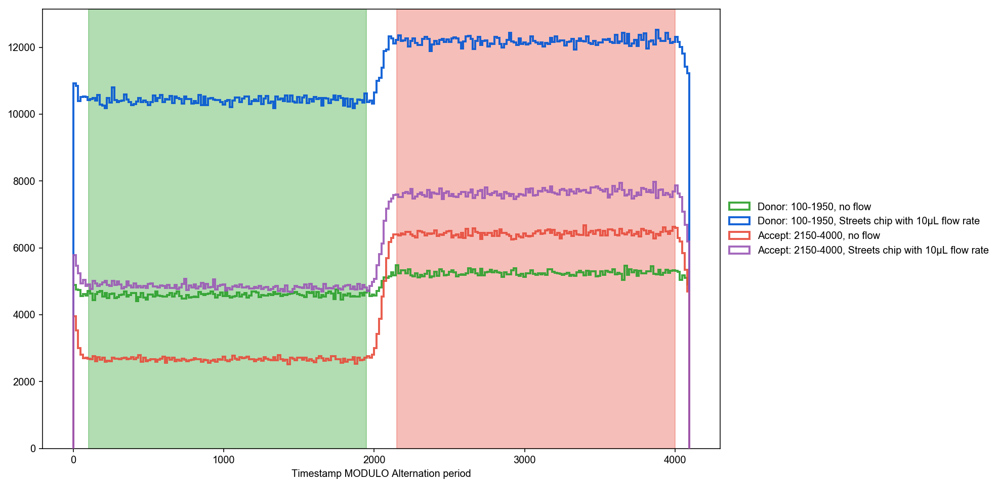

In [19]:
fig, ax = plt.subplots(figsize=(12, 8))
plot_alternation_hist_usalex(d0, d1, ax=ax, bins=np.arange(0, 4097, 16))
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_alternation_hist.png', bbox_inches='tight', dpi=1200);

In [20]:
%%timeit -n1 -r1 
loader.alex_apply_period(d0) 
loader.alex_apply_period(d1)

# Total photons (after ALEX selection):   121,766,143
#  D  photons in D+A excitation periods:   61,895,751
#  A  photons in D+A excitation periods:   59,870,392
# D+A photons in  D  excitation period:    48,825,342
# D+A photons in  A  excitation period:    72,940,801

# Total photons (after ALEX selection):   314,610,922
#  D  photons in D+A excitation periods:  162,968,031
#  A  photons in D+A excitation periods:  151,642,891
# D+A photons in  D  excitation period:    91,730,911
# D+A photons in  A  excitation period:   222,880,011

28.7 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


# Select first 0 - 200 s

In [21]:
d0.time_max, d1.time_max

(300.05318665, 300.08232792499996)

In [22]:
d0 = d0.slice_ph(time_s1=0, time_s2=200)
d1 = d1.slice_ph(time_s1=0, time_s2=200)

In [23]:
d0.time_max, d1.time_max

(199.99998507499998, 199.99999778749998)

# Timetraces

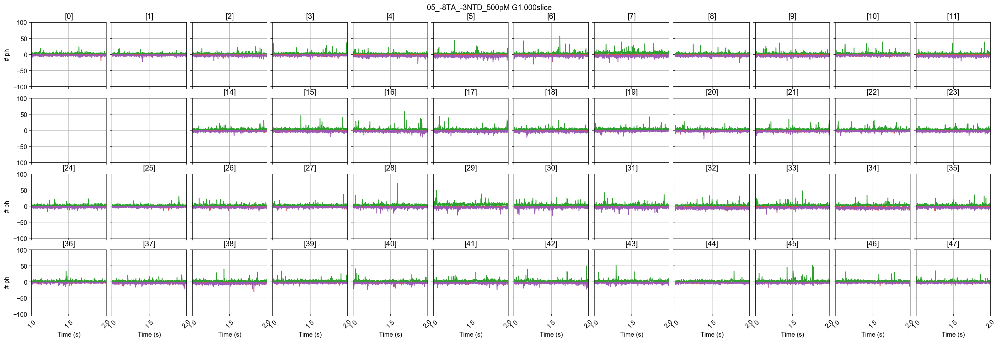

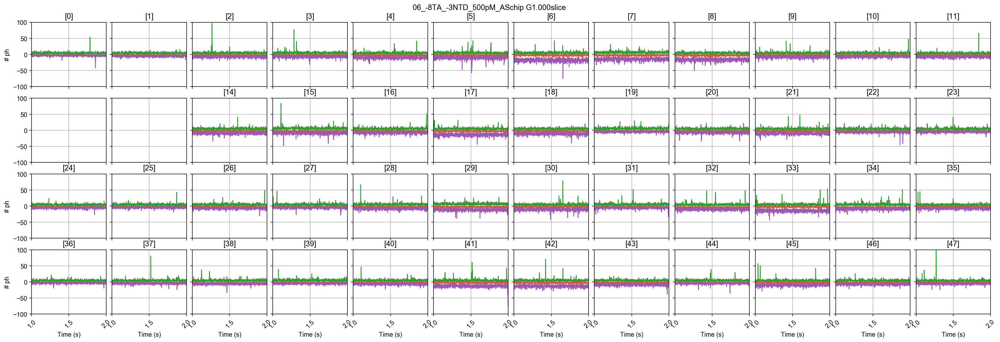

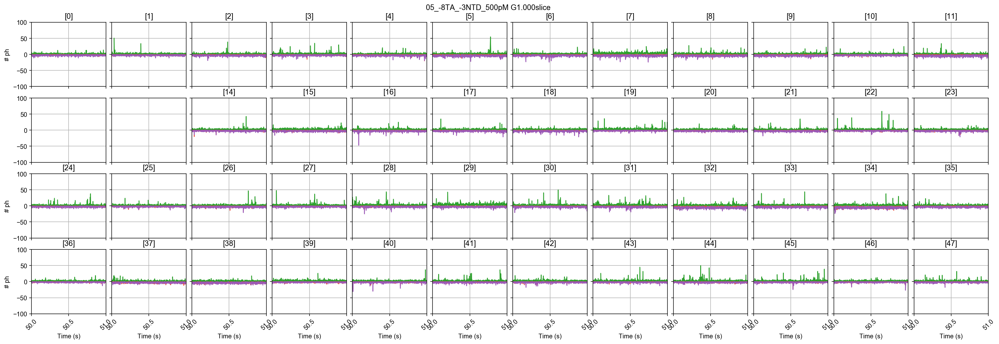

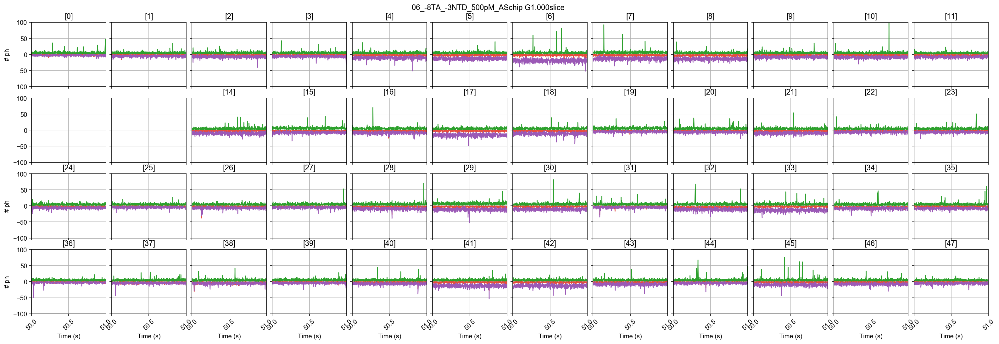

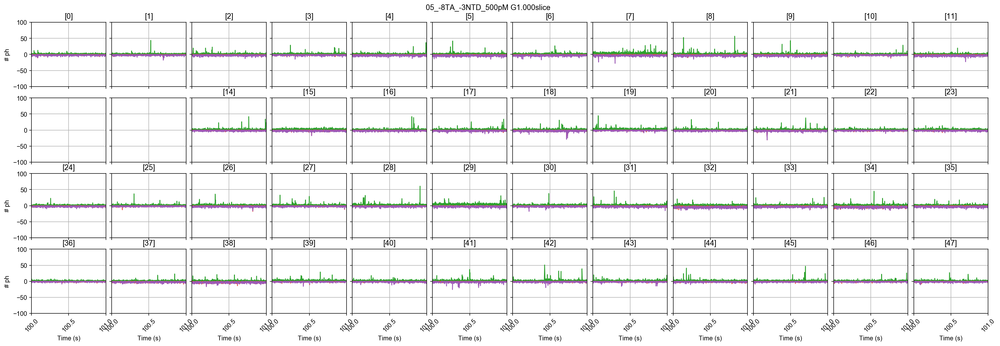

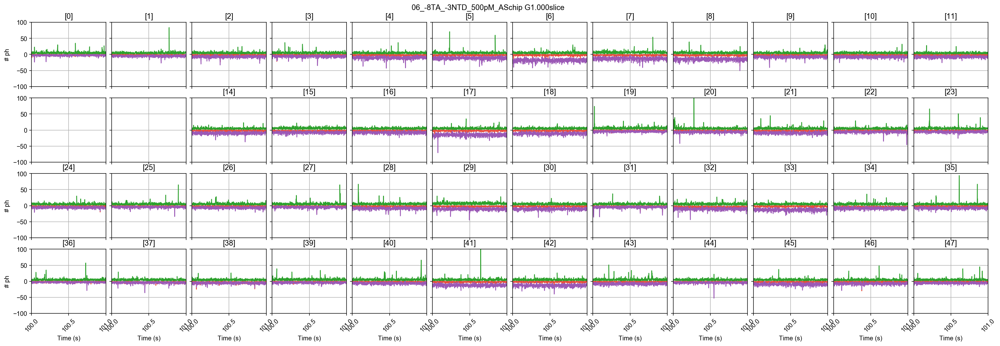

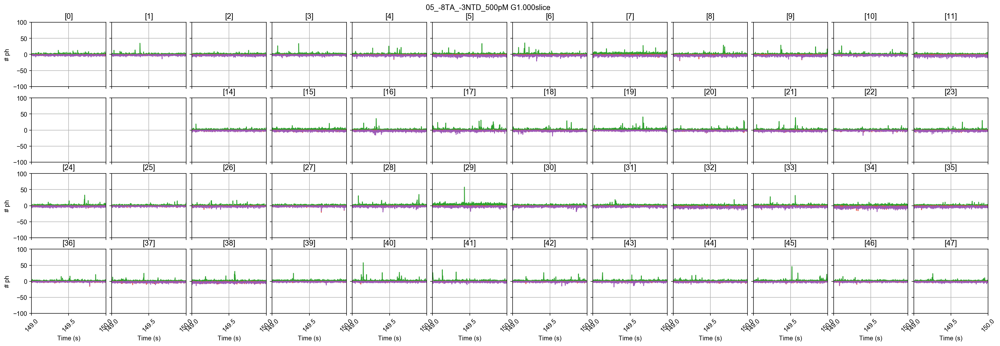

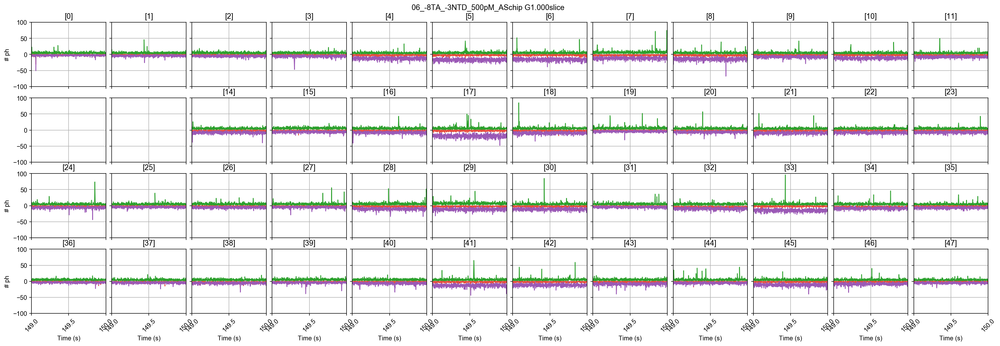

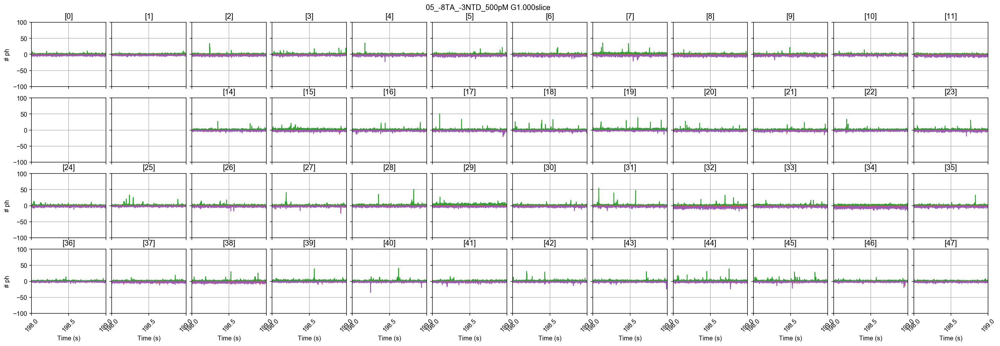

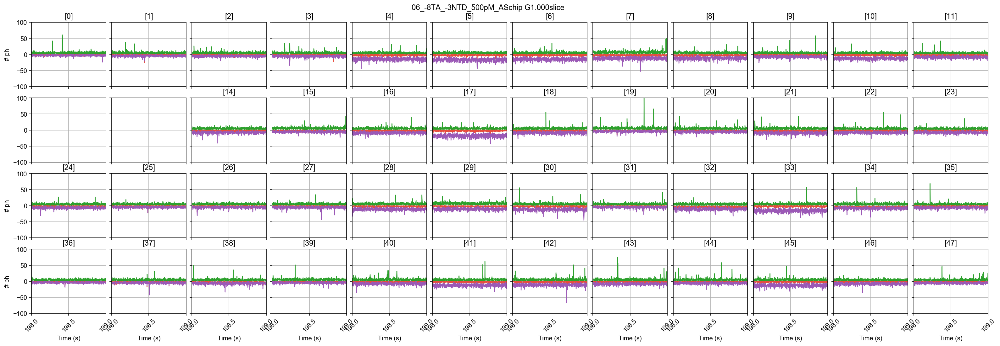

In [24]:
if plot_timetraces:
    num_time_points = 5
    kws = dict(figsize=(24, 8), skip_ch=skip_ch, xrotation=45)
    
    # Timepoints equally distributed along the measurement
    time_points = np.round(np.linspace(d0.time_min+1, d0.time_max-2, num=num_time_points))

    for i in time_points:
        dplot(d0, timetrace, tmin=i, tmax=i+1, **kws)
        plt.ylim(-100, 100)
        plt.savefig(f'{save_dir}/no_flow_timetrace={i}-{i+1}.png', dpi=1200)
        
        dplot(d1, timetrace, tmin=i, tmax=i+1, **kws)
        plt.ylim(-100, 100)
        plt.savefig(f'{save_dir}/Streets_chip_with_flow_timetrace={i}-{i+1}.png', dpi=1200);

# Background

In [25]:
d0.calc_bg(bg.exp_fit, time_s=10, tail_min_us='auto', F_bg=1)
d1.calc_bg(bg.exp_fit, time_s=10, tail_min_us='auto', F_bg=1)

 - Calculating BG rates ... [DONE]
 - Calculating BG rates ... [DONE]


## Plot background rates

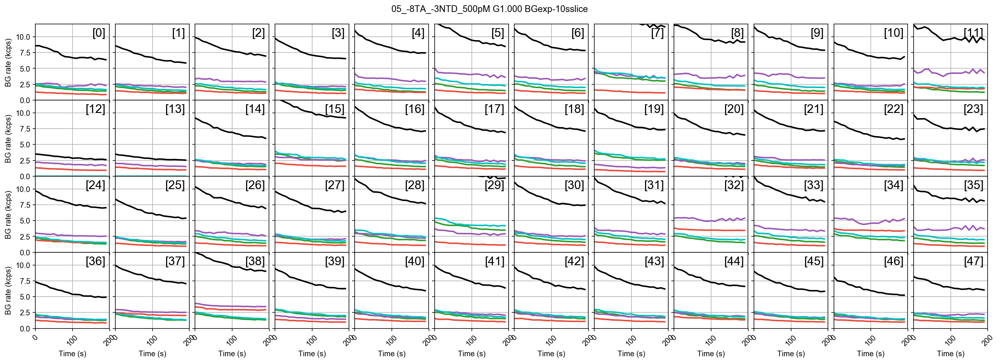

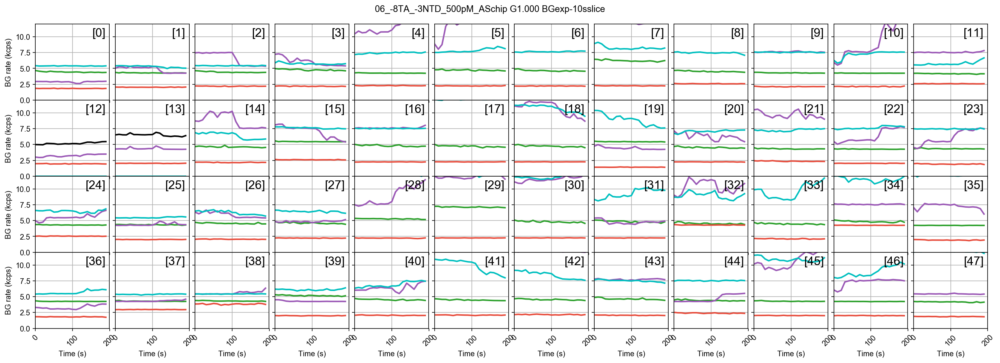

In [26]:
ax = dplot(d0, timetrace_bg, show_da=True, hspace=0, wspace=0.08,
           plot_style=dict(marker=None), title='right top', 
           title_kws=dict(fontsize=16), xrotation=45)
plt.xlim(0)
plt.ylim(0, 12)
plt.savefig(f'{save_dir}/{mlabels[0]}_background_48-spots_all_streams.png', bbox_to_anchor='tight', dpi = 1200)

ax = dplot(d1, timetrace_bg, show_da=True, hspace=0, wspace=0.08,
           plot_style=dict(marker=None), title='right top', 
           title_kws=dict(fontsize=16), xrotation=45)
plt.xlim(0)
plt.ylim(0, 12)
plt.savefig(f'{save_dir}/{mlabels[1]}_background_48-spots_all_streams.png', bbox_to_anchor='tight', dpi = 1200);

In [27]:
bg_AexDem_0 = d0.bg_from(Ph_sel(Aex='Dem'))
bg_AexAem_0 = d0.bg_from(Ph_sel(Aex='Aem'))
bg_DexDem_0 = d0.bg_from(Ph_sel(Dex='Dem'))
bg_DexAem_0 = d0.bg_from(Ph_sel(Dex='Aem'))

bg_AexDem_1 = d1.bg_from(Ph_sel(Aex='Dem'))
bg_AexAem_1 = d1.bg_from(Ph_sel(Aex='Aem'))
bg_DexDem_1 = d1.bg_from(Ph_sel(Dex='Dem'))
bg_DexAem_1 = d1.bg_from(Ph_sel(Dex='Aem'))

In [28]:
import matplotlib.patches as mpatches

In [29]:
green_patch = mpatches.Patch(color=green, label='no flow')
red_patch = mpatches.Patch(color=red, label='no flow')
blue_patch = mpatches.Patch(color=blue, label='flow rate = 10μL/hr')
purple_patch = mpatches.Patch(color=purple, label='flow rate = 10μL/hr')

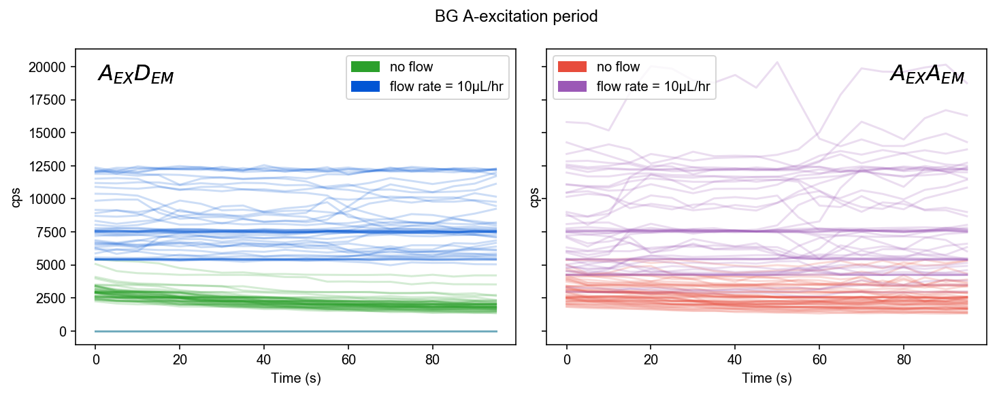

In [30]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG A-excitation period")
t0 = np.arange(len(bg_AexDem_0[0])) * 5
t1 = np.arange(len(bg_AexDem_1[0])) * 5
ax[0].plot(t0, np.array(bg_AexDem_0).T, color=green, alpha=0.2)
ax[1].plot(t0, np.array(bg_AexAem_0).T, color=red, alpha=0.2)
ax[0].plot(t1, np.array(bg_AexDem_1).T, color=blue, alpha=0.2)
ax[1].plot(t1, np.array(bg_AexAem_1).T, color=purple, alpha=0.2)
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$A_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$A_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].text(0.05, 0.95, '$A_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$A_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].legend(handles=[green_patch, blue_patch], loc='upper right')
ax[1].legend(handles=[red_patch, purple_patch], loc='upper left')
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_background_AexDem_AexAem.png', bbox_to_anchor='tight', dpi = 1200);

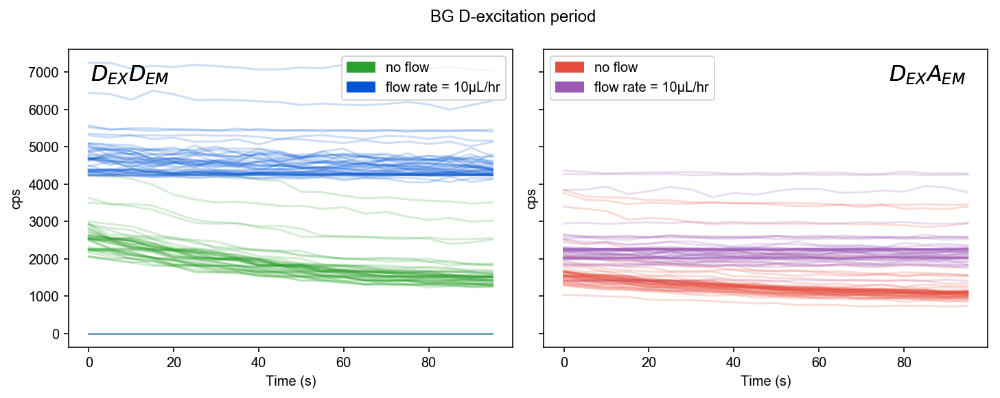

In [31]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True, sharey=True)
fig.suptitle("BG D-excitation period")
t0 = np.arange(len(bg_DexDem_0[0])) * 5
t1 = np.arange(len(bg_DexDem_1[0])) * 5
ax[0].plot(t0, np.array(bg_DexDem_0).T, color=green, alpha=0.2)
ax[1].plot(t0, np.array(bg_DexAem_0).T, color=red, alpha=0.2)
ax[0].plot(t1, np.array(bg_DexDem_1).T, color=blue, alpha=0.2)
ax[1].plot(t1, np.array(bg_DexAem_1).T, color=purple, alpha=0.2)
plt.setp(ax, xlabel='Time (s)', ylabel='cps')
plt.subplots_adjust(wspace=0.07)
ax[0].text(0.05, 0.95, '$D_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$D_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].text(0.05, 0.95, '$D_{EX}D_{EM}$', va='top', fontsize=16, transform=ax[0].transAxes)
ax[1].text(0.95, 0.95, '$D_{EX}A_{EM}$', va='top', ha='right', fontsize=16, transform=ax[1].transAxes)
ax[0].legend(handles=[green_patch, blue_patch], loc='upper right')
ax[1].legend(handles=[red_patch, purple_patch], loc='upper left')
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_background_DexDem_DexAem.png', bbox_to_anchor='tight', dpi = 1200);

## Plot interphoton delays

In [32]:
plot_style = dict(marker='o', markersize=1, linestyle='none', alpha=0.6)

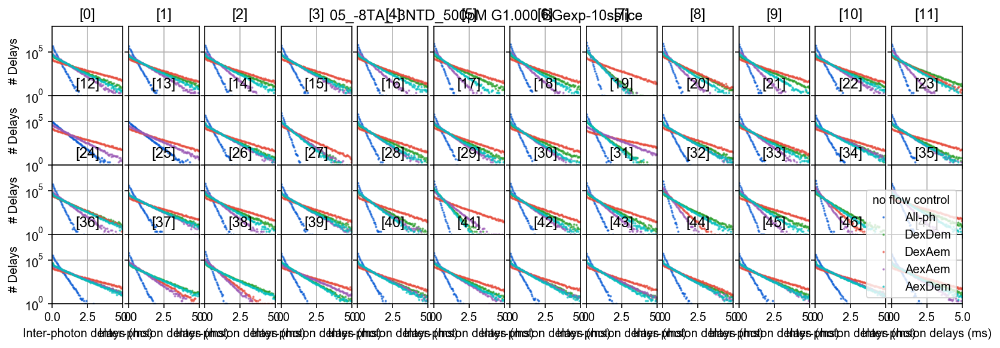

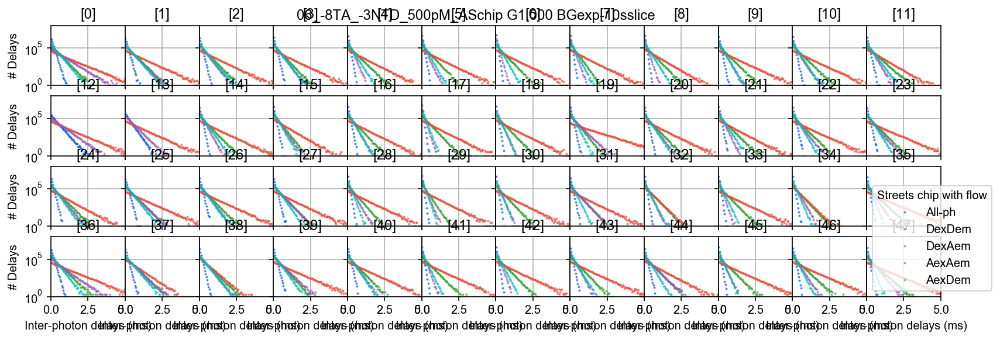

In [33]:
dplot(d0, hist_interphoton, binwidth=50e-6, show_da=True, 
      suptitle=True, hspace=0, wspace=0.08, figsize=(12, 4), 
      legend=True, plot_style=plot_style)
plt.xlim(50e-6, 5)
plt.ylim(1, 1e8)
plt.legend(title='no flow control')

dplot(d1, hist_interphoton, binwidth=50e-6, show_da=True, 
      suptitle=True, wspace=0, figsize=(12, 4), 
      legend=True, plot_style=plot_style)
plt.xlim(50e-6, 5)
plt.ylim(1, 1e8)
plt.legend(title='Streets chip with flow');

In [34]:
def _normalize_kwargs(kwargs, kind='patch'):
    """Convert matplotlib keywords from short to long form."""
    if kwargs is None:
        return {}

    if kind == 'line2d':
        long_names = dict(c='color', ls='linestyle', lw='linewidth',
                          mec='markeredgecolor', mew='markeredgewidth',
                          mfc='markerfacecolor', ms='markersize',)
    elif kind == 'patch':
        long_names = dict(c='color', ls='linestyle', lw='linewidth',
                          ec='edgecolor', fc='facecolor',)
    for short_name in long_names:
        if short_name in kwargs:
            kwargs[long_names[short_name]] = kwargs.pop(short_name)
    return kwargs

In [35]:
_ph_sel_color_dict = {Ph_sel('all'): blue, 
                      Ph_sel(Dex='Dem'): green,
                      Ph_sel(Dex='Aem'): red, 
                      Ph_sel(Aex='Aem'): purple,
                      Ph_sel(Aex='Dem'): 'c', }
_ph_sel_label_dict = {Ph_sel('all'): 'All-ph', 
                      Ph_sel(Dex='Dem'): 'DexDem',
                      Ph_sel(Dex='Aem'): 'DexAem', 
                      Ph_sel(Aex='Aem'): 'AexAem',
                      Ph_sel(Aex='Dem'): 'AexDem'}

In [36]:
def hist_interphoton_single(d0, d1, i=0, binwidth=1e-4, tmax=None, bins=None,
                            ph_sel=Ph_sel('all'), period=None,
                            yscale='log', xscale='linear', xunit='ms',
                            plot_style=None):
    
    unit_dict = {'s': 1, 'ms': 1e3, 'us': 1e6, 'ns': 1e9}
    assert xunit in unit_dict
    scalex = unit_dict[xunit]

    # Compute interphoton delays
    if period is None:
        ph0_times = d0.get_ph_times(ich=i, ph_sel=ph_sel)
        ph1_times = d1.get_ph_times(ich=i, ph_sel=ph_sel)
    else:
        ph0_times = d0.get_ph_times_period(ich=i, period=period, ph_sel=ph_sel)
        ph1_times = d1.get_ph_times_period(ich=i, period=period, ph_sel=ph_sel)
    delta_ph0_t = np.diff(ph0_times) * d0.clk_p
    delta_ph1_t = np.diff(ph1_times) * d1.clk_p
    if tmax is None:
        tmax0 = delta_ph0_t.max()
        tmax1 = delta_ph1_t.max()
        
    # Compute bin edges if not passed in
    if bins is None:
        # Shift by half clk_p to avoid "beatings" in the distribution
        # due to floating point inaccuracies.
        bins0 = np.arange(0, tmax0 + binwidth, binwidth) - 0.5 * d0.clk_p
        bins1 = np.arange(0, tmax1 + binwidth, binwidth) - 0.5 * d1.clk_p
    else:
        warnings.warn('Using `bins` and ignoring `tmax` and `binwidth`.')
    t0_ax = bins0[:-1] + 0.5 * binwidth
    t1_ax = bins1[:-1] + 0.5 * binwidth

    # Compute interphoton histogram
    counts0, _ = np.histogram(delta_ph0_t, bins=bins0)
    counts1, _ = np.histogram(delta_ph1_t, bins=bins1)

    # Max index with counts > 0
    n0_trim = np.trim_zeros(counts0).size + 1
    n1_trim = np.trim_zeros(counts1).size + 1

    # Plot histograms
    plot_style_ = dict(lw=4, alpha=0.7)
    
    #if ph_sel in _ph_sel_color_dict:
        #plot_style_['color'] = _ph_sel_color_dict[ph_sel]
        #plot_style_['label'] = _ph_sel_label_dict[ph_sel]
    
    plot_style_.update(_normalize_kwargs(plot_style, kind='line2d'))
    plot(t0_ax[:n0_trim] * scalex, counts0[:n0_trim], **plot_style_)
    plot(t1_ax[:n1_trim] * scalex, counts1[:n1_trim], **plot_style_)

    if yscale == 'log':
        gca().set_yscale(yscale)
        plt.ylim(1)
        _plot_status['hist_interphoton_single'] = {'autoscale': False}
    if xscale == 'log':
        gca().set_xscale(yscale)
        plt.xlim(0.5 * binwidth)
        _plot_status['hist_interphoton_single'] = {'autoscale': False}
    plt.xlabel('Inter-photon delays (%s)' % xunit.replace('us', 'μs'))
    plt.ylabel('# Delays')
    # Return internal variables so that other functions can extend the plot
    return dict(counts0=counts0, counts1=counts1, n0_trim=n0_trim, n1_trim=n1_trim, plot_style_=plot_style_,
                t0_ax=t0_ax, t1_ax=t1_ax, scalex=scalex)

In [37]:
def hist_interphoton(d0, d1, i=0, binwidth=1e-4, tmax=None, bins=None, period=None,
                     yscale='log', xscale='linear', xunit='ms', plot_style=None,
                     show_da=False, legend=True):
   
    # Plot multiple timetraces
    ph_sel_list = [Ph_sel('all'), Ph_sel(Dex='Dem'), Ph_sel(Dex='Aem')]
    if d0.alternated:
        ph_sel_list.append(Ph_sel(Aex='Aem'))
        if show_da:
            ph_sel_list.append(Ph_sel(Aex='Dem'))

    for ix, ph_sel in enumerate(ph_sel_list):
        if not bl.mask_empty(d0.get_ph_mask(i, ph_sel=ph_sel)):
            hist_interphoton_single(d0, d1, i=i, binwidth=binwidth, tmax=None, bins=None, 
                                    period=period, ph_sel=ph_sel,
                                    yscale=yscale, xscale=xscale, xunit=xunit,
                                    plot_style=plot_style)
            
            
            
    if legend:
        plt.legend(loc='best')

    if yscale == 'log' or xscale == 'log':
        _plot_status['hist_interphoton'] = {'autoscale': False}


In [38]:
legend_dict = dict(label_0 = 'All-ph: no flow', 
               label_1 = 'All-ph: Streets chip with flow', 
               label_2 = 'DexDem: no flow', 
               label_3 = 'DexDem: Streets chip with flow', 
               label_4 = 'DexAem: no flow', 
               label_5 = 'DexAem: Streets chip with flow',
               label_6 = 'AexAem: no flow', 
               label_7 = 'AexAem: Streets chip with flow')

No handles with labels found to put in legend.


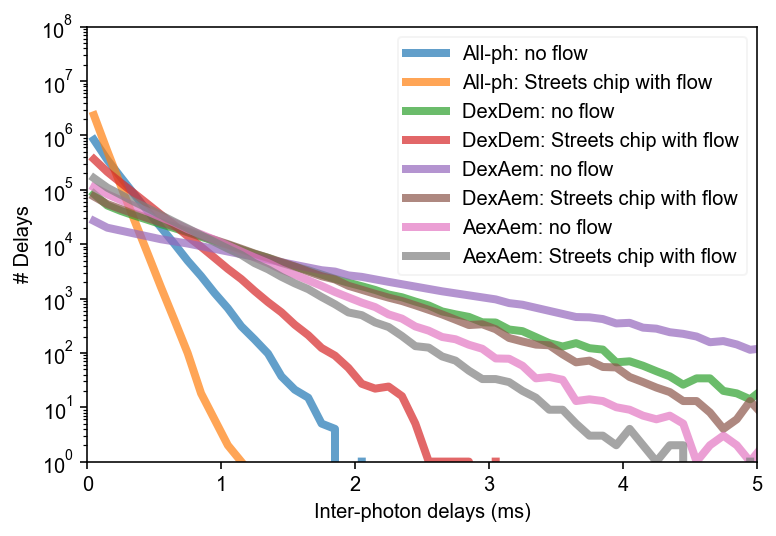

In [39]:
hist_interphoton(d0, d1, i=0, binwidth=1e-4, tmax=None, bins=None, period=None,
                     yscale='log', xscale='linear', xunit='ms', plot_style=None,
                     show_da=False)
plt.xlim(50e-6, 5)
plt.ylim(1, 1e8)
plt.legend(legend_dict.values(), framealpha=0.2)
plt.savefig(f'{save_dir}/{mlabels[0]}_{mlabels[1]}_interphoton_delay_distribution_nt.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst searches

In order to compare the control measurement without flow to the measurement acquired with the Streets chip under flow conditions, it is necessary to test the effect of different burst searches. Two burst searches will be tested, where only one parameter is changed:
1. Burst search using a fixed threshold
    - 50 kcps for control sample without flow
    - 75 kcps for sample with flow
    - 80 kcps for sample with flow
2. Burst search using a moving threshold
    - F = 6 for control sample without flow
    - F = 6 for sample with flow

In [40]:
Dex0 = d0.setup['excitation_input_powers'][0] * 1e3
Dex1 = d1.setup['excitation_input_powers'][0] * 1e3
Aex0 = d0.setup['excitation_input_powers'][1] * 1e3
Aex1 = d1.setup['excitation_input_powers'][1] * 1e3
power0 = f'D{Dex0:.0f}mW_A{Aex0:.0f}mW'
power1 = f'D{Dex1:.0f}mW_A{Aex1:.0f}mW'
power0, power1 

('D300mW_A600mW', 'D500mW_A800mW')

In [41]:
Dex_ratio = 300 / 500 # [mW]
Aex_ratio = 600 / 800 # [mW]
Dex_ratio, Aex_ratio

(0.6, 0.75)

In [42]:
cps_ratio = np.mean((50e3 / Dex_ratio, 50e3 / Aex_ratio))
cps_ratio

75000.0

**Compare burst search results for three cases**

1. No flow control, th = 50kcps vs Streets chip with flow, th=75kcps 
  
2. No flow control, th = 50kcps vs Streets chip with flow, th=80kcps

3. No flow control, F=6 vs Streets chip with flow, F=6

In [43]:
bsearch_params_constant_50kcps = dict(m=10, ph_sel=Ph_sel('all'), pax=True, min_rate_cps=50_000) #d0, no flow
bsearch_params_constant_75kcps = dict(m=10, ph_sel=Ph_sel('all'), pax=True, min_rate_cps=75_000) #d1, with flow
bsearch_params_constant_80kcps = dict(m=10, ph_sel=Ph_sel('all'), pax=True, min_rate_cps=80_000) #d2, with flow

bsearch_params_moving_F6 = dict(m=10, ph_sel=Ph_sel('all'), pax=True, F=6) #d3 with flow, d4 without flow

In [44]:
#d0: no flow, 50kcps
#d1: with flow, 75kcps

d2 = d1.copy() #with flow, 80kcps 
d3 = d0.copy() #no flow, F = 6
d4 = d1.copy() #with flow, F = 6

Deep copy executed.
Deep copy executed.
Deep copy executed.


In [45]:
d_list = [d0, d1, d2, d3, d4]
d_list

[05_-8TA_-3NTD_500pM G1.000 BGexp-10sslice,
 06_-8TA_-3NTD_500pM_ASchip G1.000 BGexp-10sslice,
 06_-8TA_-3NTD_500pM_ASchip G1.000 BGexp-10sslice,
 05_-8TA_-3NTD_500pM G1.000 BGexp-10sslice,
 06_-8TA_-3NTD_500pM_ASchip G1.000 BGexp-10sslice]

In [46]:
d0.burst_search(**bsearch_params_constant_50kcps) # no flow
d1.burst_search(**bsearch_params_constant_75kcps) # with flow
d2.burst_search(**bsearch_params_constant_80kcps) # with flow 

d3.burst_search(**bsearch_params_moving_F6) # no flow
d4.burst_search(**bsearch_params_moving_F6) # with flow

 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]
 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]
 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]
 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting D/A]
 - Performing burst search (verbose=False) ...[DONE]
 - Calculating burst periods ...[DONE]
 - Counting D and A ph and calculating FRET ... 
   - Applying background correction.
   [DONE Counting 

In [47]:
d0.calc_max_rate(m=bsearch_params_constant_50kcps['m'])
d1.calc_max_rate(m=bsearch_params_constant_75kcps['m'])
d2.calc_max_rate(m=bsearch_params_constant_80kcps['m'])

d3.calc_max_rate(m=bsearch_params_moving_F6['m'])
d4.calc_max_rate(m=bsearch_params_moving_F6['m'])

In [50]:
fig_name_50kcps = f'{save_dir}/{f0}_bsearch_params'
for k, v in bsearch_params_constant_50kcps.items():
    fig_name_50kcps += f'_{k}_{v}'
fig_name_50kcps

'/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures/05_-8TA_-3NTD_500pM_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_50000'

In [51]:
fig_name_75kcps = f'{save_dir}/{f1}_bsearch_params'
for k, v in bsearch_params_constant_75kcps.items():
    fig_name_75kcps += f'_{k}_{v}'
fig_name_75kcps

'/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures/06_-8TA_-3NTD_500pM_ASchip_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_75000'

In [52]:
fig_name_80kcps = f'{save_dir}/{f1}_bsearch_params'
for k, v in bsearch_params_constant_80kcps.items():
    fig_name_80kcps += f'_{k}_{v}'
fig_name_80kcps

'/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures/06_-8TA_-3NTD_500pM_ASchip_bsearch_params_m_10_ph_sel_all_pax_True_min_rate_cps_80000'

In [53]:
fig_name_nf_F6 = f'{save_dir}/{f0}_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fig_name_nf_F6 += f'_{k}_{v}'
fig_name_nf_F6

'/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures/05_-8TA_-3NTD_500pM_bsearch_params_m_10_ph_sel_all_pax_True_F_6'

In [54]:
fig_name_f_F6 = f'{save_dir}/{f1}_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fig_name_f_F6 += f'_{k}_{v}'
fig_name_f_F6

'/Users/maya/Documents/weiss_lab/48-spot/multispot_review_results/figures/06_-8TA_-3NTD_500pM_ASchip_bsearch_params_m_10_ph_sel_all_pax_True_F_6'

# Burst size distributions

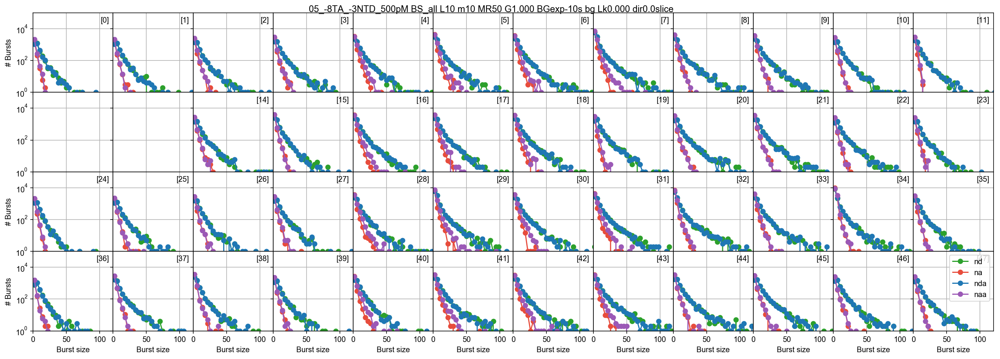

In [55]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d0, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_50kcps}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

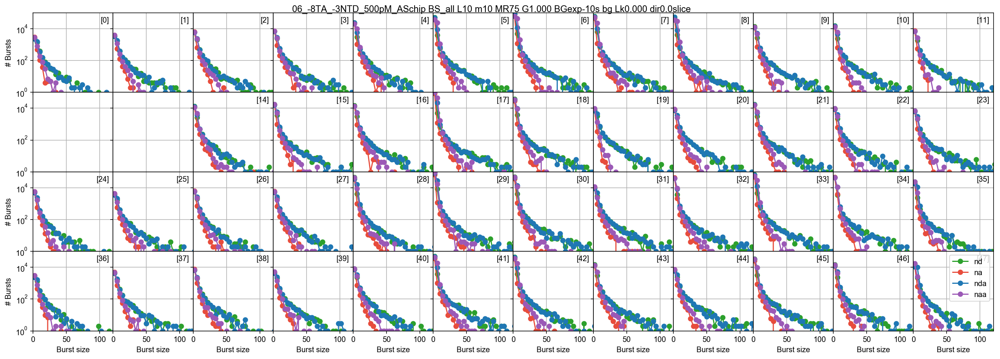

In [56]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d1, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_75kcps}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

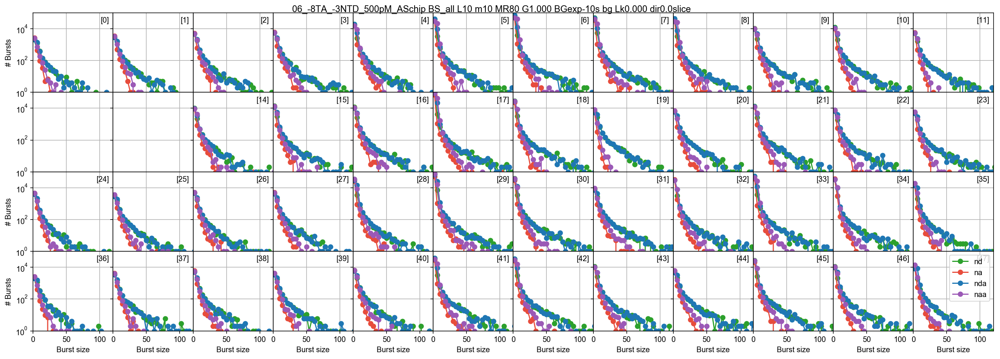

In [57]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d2, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_80kcps}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

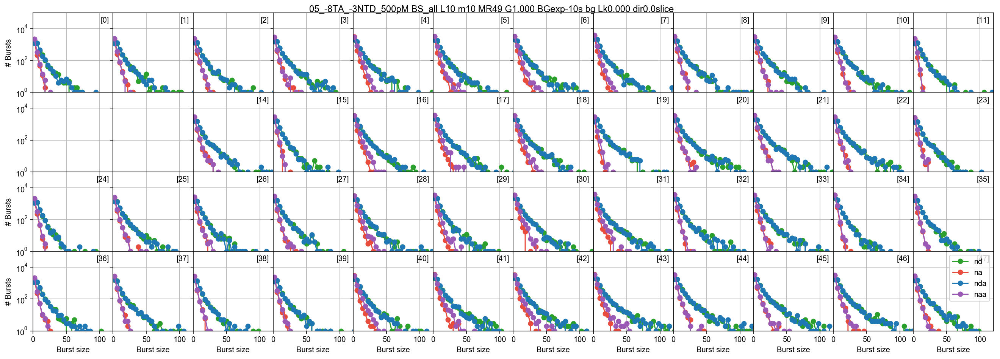

In [58]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d3, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_nf_F6}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

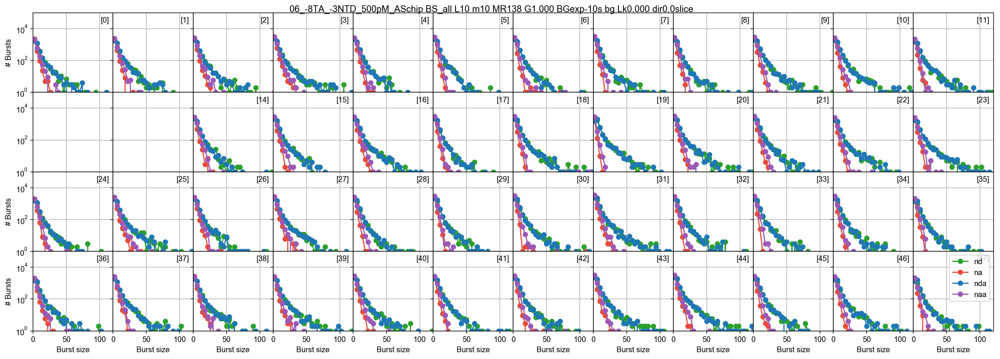

In [ ]:
kws = dict(skip_ch=skip_ch, hspace=0, wspace=0, top=0.96, 
           title_bg=False, title_nbursts=False, title='in')

dplot(d4, hist_size_all, **kws)
plt.xlim(0, 120)
plt.ylim(1, 1e5)
plt.legend()
plt.savefig(f'{fig_name_f_F6}_burst_size_all_ph-streams_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
size_th = 40
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d0, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d0._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_50kcps}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
size_th = 64
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d1, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d1._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_75kcps}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
size_th = 64
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d2, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d2._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_80kcps}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
size_th = 40
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d3, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d3._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_nf_F6}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
size_th = 64
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)
dplot(d4, hist_size, vline=size_th, **size_sel_kws, **kws);
plt.xlim(-10, 300)
plt.ylim(1, 1e5)
plt.legend(fontsize=15, loc='upper right')
Math(d4._burst_sizes_pax_formula(**size_sel_kws))
plt.savefig(f'{fig_name_f_F6}_burst_size_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'),
                    na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d0._burst_sizes_pax_formula(**size_sel_kws))

In [ ]:
bs_mean_50kcps = []
bs_mean_75kcps = []
bs_mean_80kcps = []
bs_mean_nf_F6 = []
bs_mean_f_F6 = []

for i in range(48):
    sizes_ch = d0.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_50kcps.append(sizes_ch[tail].mean() - size_th)
    
for i in range(48):
    sizes_ch = d1.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_75kcps.append(sizes_ch[tail].mean() - size_th)
    
for i in range(48):
    sizes_ch = d2.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_80kcps.append(sizes_ch[tail].mean() - size_th)
    
for i in range(48):
    sizes_ch = d3.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_nf_F6.append(sizes_ch[tail].mean() - size_th)
    
for i in range(48):
    sizes_ch = d4.burst_sizes_pax_ich(i, **size_sel_kws) 
    tail = sizes_ch > size_th
    bs_mean_f_F6.append(sizes_ch[tail].mean() - size_th)

In [ ]:
heatmap48(bs_mean_50kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_50kcps}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bs_mean_75kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_75kcps}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bs_mean_80kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_80kcps}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bs_mean_nf_F6, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_nf_F6}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bs_mean_f_F6, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Sizes", vmin=10, vmax=60)
plt.savefig(f'{fig_name_f_F6}_heatmap_burst_sizes.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst duration distribution 

In [ ]:
width_nf_th = 0.4
width_f_th = 0.4

In [ ]:
dplot(d0, hist_width, vline=width_nf_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_50kcps}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
dplot(d1, hist_width, vline=width_f_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_75kcps}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
dplot(d2, hist_width, vline=width_f_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_80kcps}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
dplot(d3, hist_width, vline=width_nf_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_nf_F6}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
dplot(d4, hist_width, vline=width_f_th, **kws);
plt.xlim(-0.5, 4)
plt.ylim(1e-3, 1e2)
plt.savefig(f'{fig_name_f_F6}_burst_duration_all_photons_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
bw_mean_50kcps = []
bw_mean_75kcps = []
bw_mean_80kcps = []
bw_mean_nf_F6 = []
bw_mean_f_F6 = []

for i in range(48):
    widths_ch = d0.mburst[i].width * d0.clk_p * 1e3
    tail = widths_ch > width_nf_th
    bw_mean_50kcps.append(widths_ch[tail].mean() - width_nf_th)

for i in range(48):
    widths_ch = d1.mburst[i].width * d1.clk_p * 1e3
    tail = widths_ch > width_f_th
    bw_mean_75kcps.append(widths_ch[tail].mean() - width_f_th)
    
for i in range(48):
    widths_ch = d2.mburst[i].width * d2.clk_p * 1e3
    tail = widths_ch > width_f_th
    bw_mean_80kcps.append(widths_ch[tail].mean() - width_f_th)
    
for i in range(48):
    widths_ch = d3.mburst[i].width * d3.clk_p * 1e3
    tail = widths_ch > width_nf_th
    bw_mean_nf_F6.append(widths_ch[tail].mean() - width_nf_th)
    
for i in range(48):
    widths_ch = d4.mburst[i].width * d4.clk_p * 1e3
    tail = widths_ch > width_f_th
    bw_mean_f_F6.append(widths_ch[tail].mean() - width_f_th)

In [ ]:
heatmap48(bw_mean_50kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_50kcps}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bw_mean_75kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_75kcps}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bw_mean_80kcps, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_80kcps}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bw_mean_nf_F6, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_nf_F6}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(bw_mean_f_F6, cmap='viridis', skip_ch=skip_ch,
          title="Mean Burst Width (ms)", vmin=0.1, vmax=0.25)
plt.savefig(f'{fig_name_f_F6}_heatmap_burst_widths.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
%run -i cal_phrates.py 

In [ ]:
# Use recompute=True if changing burst-search parameters
recompute = False
phrates = {}
streams = ('all', 'DexDem', 'AexDem', 'DexAem', 'AexAem', )

In [ ]:
phrates_50kcps = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d0, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_constant_50kcps, 
               phrates=phrates_50kcps, recompute=recompute)
    

In [ ]:
phrates_75kcps = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d1, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_constant_75kcps, 
               phrates=phrates_75kcps, recompute=recompute)
    

In [ ]:
phrates_80kcps = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d2, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_constant_80kcps, 
               phrates=phrates_80kcps, recompute=recompute)
    

In [ ]:
phrates_nf_F6 = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d3, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_moving_F6, 
               phrates=phrates_nf_F6, recompute=recompute)
    

In [ ]:
phrates_f_F6 = {}
for stream in streams:
    print(f' - Computing peak photon rates for {Ph_sel.from_str(stream)} stream.')
    cal_phrate(d4, stream=Ph_sel.from_str(stream), 
               bsearch_params=bsearch_params_moving_F6, 
               phrates=phrates_f_F6, recompute=recompute)
    

In [ ]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_50kcps['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_50kcps['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_50kcps['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=60, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_50kcps['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_50kcps[10:]}')
plt.legend()
plt.savefig(f'{fig_name_50kcps}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_75kcps['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_75kcps['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_75kcps['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=65, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_75kcps['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_75kcps[10:]}')
plt.legend()
plt.savefig(f'{fig_name_75kcps}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_80kcps['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_80kcps['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_80kcps['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=65, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_80kcps['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_80kcps[10:]}')
plt.legend()
plt.savefig(f'{fig_name_80kcps}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_nf_F6['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_nf_F6['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_nf_F6['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=60, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_nf_F6['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_nf_F6[10:]}')
plt.legend()
plt.savefig(f'{fig_name_nf_F6}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
kws = dict(figsize=(18, 6), skip_ch=skip_ch, wspace=0, hspace=0, grid=True, 
           title=None, title_nbursts=False, title_bg=False, xrotation=45)

ax = dplot(phrates_f_F6['AexAemB'], hist_burst_phrate, 
           plot_style=dict(color=bpl.purple, label='naa', ms=3), **kws)
dplot(phrates_f_F6['AexDemB'], hist_burst_phrate, 
      plot_style=dict(color='C0', label='nda', ms=3), AX=ax, **kws)
dplot(phrates_f_F6['DexDemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.green, label='nd', ms=3), AX=ax, **kws)
kws.update(vline=65, title='in', title_nbursts=False, title_bg=False,)
dplot(phrates_f_F6['DexAemB'], hist_burst_phrate, 
      plot_style=dict(color=bpl.red, label='na', ms=3), AX=ax, **kws)
plt.xlim(-50, 1150)
plt.ylim(1e-4, 1e-1)
plt.setp(ax[:, 0], ylabel='PDF')
plt.setp(ax[-1], xlabel='kcps')
plt.suptitle(f'{fig_name_f_F6[10:]}')
plt.legend()
plt.savefig(f'{fig_name_f_F6}_peak_phrate_all_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Burst selection

Define bursts as the sum of uncorrected PAX photon streams:

In [ ]:
# all uncorrected PAX photon streams
size_nf_th = 40 
size_f_th = 65

size_sel_kws = dict(ph_sel=Ph_sel(Dex='DAem', Aex='DAem'), gamma=1,
                    na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d0._burst_sizes_pax_formula(**size_sel_kws))

In [ ]:
# applying size selections

ds0 = d0.select_bursts(select_bursts.size, th1=size_nf_th, **size_sel_kws)
Su0 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds0.nd, ds0.na, ds0.naa)]
ds0.add(Su0=Su0)

ds1 = d1.select_bursts(select_bursts.size, th1=size_f_th, **size_sel_kws)
Su1 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds1.nd, ds1.na, ds1.naa)]
ds1.add(Su1=Su1)

ds2 = d2.select_bursts(select_bursts.size, th1=size_f_th, **size_sel_kws)
Su2 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds2.nd, ds2.na, ds2.naa)]
ds2.add(Su2=Su2)

ds3 = d3.select_bursts(select_bursts.size, th1=size_nf_th, **size_sel_kws)
Su3 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds3.nd, ds3.na, ds3.naa)]
ds3.add(Su3=Su3)

ds4 = d4.select_bursts(select_bursts.size, th1=size_f_th, **size_sel_kws)
Su4 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(ds4.nd, ds4.na, ds4.naa)]
ds4.add(Su4=Su4)

In [ ]:
heatmap48(ds0.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_50kcps[10:]}", vmin=0, vmax=500)
plt.savefig(f'{fig_name_50kcps}_size_sel_all_{size_nf_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(ds1.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_75kcps[10:]}", vmin=0, vmax=500)
plt.savefig(f'{fig_name_75kcps}_size_sel_all_{size_f_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(ds2.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_80kcps[10:]}", vmin=0, vmax=500)
plt.savefig(f'{fig_name_80kcps}_size_sel_all_{size_f_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(ds3.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_nf_F6[10:]}", vmin=0, vmax=500)
plt.savefig(f'{fig_name_nf_F6}_size_sel_all_{size_nf_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
heatmap48(ds4.num_bursts, cmap='viridis', skip_ch=skip_ch,
          title=f"Number of bursts \n {fig_name_f_F6[10:]}", vmin=0, vmax=500)
plt.savefig(f'{fig_name_f_F6}_size_sel_all_{size_f_th}_heatmap_number_bursts.png', 
            bbox_to_anchor='tight', dpi = 1200);

# $E_{PR}-S_u$ histograms

In [ ]:
Su0 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(d0.nd, d0.na, d0.naa)]
d0.add(Su0=Su0)

Su1 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(d1.nd, d1.na, d1.naa)]
d1.add(Su1=Su1)

Su2 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(d2.nd, d2.na, d2.naa)]
d2.add(Su2=Su2)

Su3 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(d3.nd, d3.na, d3.naa)]
d3.add(Su3=Su3)

Su4 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(d4.nd, d4.na, d4.naa)]
d4.add(Su4=Su4)

In [ ]:
ax = dplot(d0, hexbin_alex, S_name='Su0', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_all_photons_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(ds0, hexbin_alex, S_name='Su0', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_size_sel_{size_nf_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(d1, hexbin_alex, S_name='Su1', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_all_photons_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(ds1, hexbin_alex, S_name='Su1', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
plt.savefig(f'{fig_name_75kcps}_size_sel_{size_f_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(d2, hexbin_alex, S_name='Su2', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_all_photons_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(ds2, hexbin_alex, S_name='Su2', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1]);
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2);
plt.savefig(f'{fig_name_80kcps}_size_sel_{size_f_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(d3, hexbin_alex, S_name='Su3', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_all_photons_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(ds3, hexbin_alex, S_name='Su3', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
plt.savefig(f'{fig_name_nf_F6}_size_sel_{size_f_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(d4, hexbin_alex, S_name='Su4', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False)
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$')
plt.setp(ax[-1], xlabel='$E_{PR}$')
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
ax0.set_ylim(0, 1.2)
plt.savefig(f'{fig_name_50kcps}_all_photons_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
ax = dplot(ds4, hexbin_alex, S_name='Su4', vmax=15, 
           wspace=0, hspace=0, gridsize=60, title='bottom left', title_bg=False);
ax0 = ax[0, 0]
fig = ax0.figure
cax = fig.add_axes([0.97, 0.25, 0.01, 0.5])
plt.setp(ax[:, 0], ylabel='$S_u$');
plt.setp(ax[-1], xlabel='$E_{PR}$');
plt.colorbar(cax=cax)
ax0.set_xticks([0, 0.5, 1])
ax0.set_yticks([0, 0.5, 1])
ax0.set_xlim(-0.2, 1)
plt.savefig(f'{fig_name_f_F6}_size_sel_{size_f_th}_alex_hist_Su_size_48spots.png', 
            bbox_to_anchor='tight', dpi = 1200);

# Collapse

Pooling data from all 48 spots

In [ ]:
df0 = d0.fuse_bursts(ms=0)
df1 = d1.fuse_bursts(ms=0)
df2 = d2.fuse_bursts(ms=0)
df3 = d3.fuse_bursts(ms=0)
df4 = d4.fuse_bursts(ms=0)

In [ ]:
dc0 = d0.collapse(update_gamma=False)
dc1 = d1.collapse(update_gamma=False)
dc2 = d2.collapse(update_gamma=False)
dc3 = d3.collapse(update_gamma=False)
dc4 = d4.collapse(update_gamma=False)

In [ ]:
# check that chi_ch is set to 1 here
dc0.chi_ch, dc1.chi_ch, dc2.chi_ch, dc3.chi_ch, dc4.chi_ch

In [ ]:
burst_sums = []

for d in d_list:
    sum = d.num_bursts.sum()
    burst_sums.append(sum)
    
burst_sums

## Burst selection matrix

In [ ]:
naa_sel_kws = dict(ph_sel=Ph_sel(Aex='Aem'), gamma=1,
                   na_comp=False, naa_comp=False, naa_aexonly=False)

Math(d0._burst_sizes_pax_formula(**naa_sel_kws))

In [ ]:
Math(d0._burst_sizes_pax_formula(**size_sel_kws))

In [ ]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds0 = d0.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss0 = ds0.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss0 = dss0.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss0.nd, dcss0.na, dcss0.naa)]
        dcss0.add(Su=Su)
        E = dcss0.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss0, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss0.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.15, 0.89, f'ACBS, {fig_name_50kcps[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_50kcps}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds1 = d1.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss1 = ds1.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss1 = dss1.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss1.nd, dcss1.na, dcss1.naa)]
        dcss1.add(Su=Su)
        E = dcss1.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss1, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss1.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.12, 0.89, f'ACBS, {fig_name_75kcps[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_75kcps}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds2 = d2.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss2 = ds2.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss2 = dss2.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss2.nd, dcss2.na, dcss2.naa)]
        dcss2.add(Su=Su)
        E = dcss2.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss2, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss2.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.12, 0.89, f'ACBS, {fig_name_80kcps[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_80kcps}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds3 = d3.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss3 = ds3.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss3 = dss3.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss3.nd, dcss3.na, dcss3.naa)]
        dcss3.add(Su=Su)
        E = dcss3.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss3, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss3.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.2, 0.89, f'ACBS, {fig_name_nf_F6[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_nf_F6}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

In [ ]:
Th = (10, 20, 40, 80)
Th_naa = np.array((0, 10, 20, 40)) 
fig, AX = plt.subplots(len(Th), len(Th_naa), figsize=(3.5*len(Th_naa), 3.5*len(Th)), sharex=True, sharey=True)
for irow, th in enumerate(Th):
    for icol, th_naa in enumerate(Th_naa):
        ax = AX[irow,icol]
        ds4 = d4.select_bursts(select_bursts.size, th1=th_naa, **naa_sel_kws)
        dss4 = ds4.select_bursts(select_bursts.size, th1=th, **size_sel_kws)
        dcss4 = dss4.collapse(update_gamma=False)
        Su = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcss4.nd, dcss4.na, dcss4.naa)]
        dcss4.add(Su=Su)
        E = dcss4.E[0]
        E_std = E[E > 0.2].std()
        dplot(dcss4, hexbin_alex, S_name='Su', gridsize=60, ax=ax)
        ax.text(0.05, 0.05, '$th_D$ = %d, $th_A$ = %d, σ = %.3f\n#B = %d' % (th, th_naa, E_std, dcss4.num_bursts), 
                va='bottom', ha='left', transform=ax.transAxes, fontsize=12)
        ax.set_title('')
plt.setp(AX[:-1], xlabel='')
plt.setp(AX[:, 1:], ylabel='')
plt.subplots_adjust(hspace=0, wspace=0)
plt.text(0.15, 0.89, f'ACBS, {fig_name_f_F6[8:]}', transform=fig.transFigure, fontsize=16)
plt.savefig(f'{fig_name_f_F6}_ACBS_size_sel_matrix_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200);

## Pooled $E_{PR} - S_u$ histograms 

In [ ]:
# define pooled an size selected data objects
dcs0 = ds0.collapse(update_gamma=False)
Su0 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs0.nd, dcs0.na, dcs0.naa)]
dcs0.add(Su0=Su0)

dcs1 = ds1.collapse(update_gamma=False)
Su1 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs1.nd, dcs1.na, dcs1.naa)]
dcs1.add(Su1=Su1)

dcs2 = ds2.collapse(update_gamma=False)
Su2 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs2.nd, dcs2.na, dcs2.naa)]
dcs2.add(Su2=Su2)

dcs3 = ds3.collapse(update_gamma=False)
Su3 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs3.nd, dcs3.na, dcs3.naa)]
dcs3.add(Su3=Su3)

dcs4 = ds4.collapse(update_gamma=False)
Su4 = [(nd + na)/(nd + na + naa) for nd, na, naa in zip(dcs4.nd, dcs4.na, dcs4.naa)]
dcs4.add(Su4=Su4)

In [ ]:
g = alex_jointplot(dcs0, S_name='Su0', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_50kcps}_size_sel_{size_nf_th}_vmax-160_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)
g = alex_jointplot(dcs1, S_name='Su1', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_75kcps}_size_sel_{size_f_th}_vmax-160_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)

In [ ]:
g = alex_jointplot(dcs0, S_name='Su0', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_50kcps}_size_sel_{size_nf_th}_vmax-160_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)
g = alex_jointplot(dcs2, S_name='Su2', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_80kcps}_size_sel_{size_f_th}_vmax-160_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)

In [ ]:
g = alex_jointplot(dcs3, S_name='Su3', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_nf_F6}_size_sel_{size_nf_th}_vmax-160_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)
g = alex_jointplot(dcs4, S_name='Su4', vmax=160, gridsize=80)
g.ax_joint.set_ylabel('$S_u$')
plt.savefig(f'{fig_name_f_F6}_size_sel_{size_f_th}_vmax-160_alex_hist_Su_48spot.png', 
            bbox_to_anchor='tight', dpi = 1200)

# Save burst search results to CSV

Burst search results are loaded into a DataFrame and saved as .CSV

In [ ]:
Path('results/').mkdir(exist_ok=True)

# Save burst results (before size selection)

In [ ]:
fname_bursts_50kcps = f'results/{f0}_bsearch_params'
for k, v in bsearch_params_constant_50kcps.items():
    fname_bursts_50kcps += f'_{k}_{v}'
fname_bursts_50kcps

In [ ]:
fname_bursts_75kcps = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_constant_75kcps.items():
    fname_bursts_75kcps += f'_{k}_{v}'
fname_bursts_75kcps

In [ ]:
fname_bursts_80kcps = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_constant_80kcps.items():
    fname_bursts_80kcps += f'_{k}_{v}'
fname_bursts_80kcps

In [ ]:
fname_bursts_nf_F6 = f'results/{f0}_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fname_bursts_nf_F6 += f'_{k}_{v}'
fname_bursts_nf_F6

In [ ]:
fname_bursts_f_F6 = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fname_bursts_f_F6 += f'_{k}_{v}'
fname_bursts_f_F6

In [ ]:
bursts_m10_50kcps = bext.burst_data(d0, include_bg=False)
bursts_m10_75kcps = bext.burst_data(d1, include_bg=False)
bursts_m10_80kcps = bext.burst_data(d2, include_bg=False)

bursts_m10_nf_F6 = bext.burst_data(d3, include_bg=False)
bursts_m10_f_F6 = bext.burst_data(d4, include_bg=False)

In [ ]:
bursts_m10_50kcps.to_csv(fname_bursts_50kcps + '.csv')
bursts_m10_75kcps.to_csv(fname_bursts_75kcps + '.csv')
bursts_m10_80kcps.to_csv(fname_bursts_80kcps + '.csv')

bursts_m10_nf_F6.to_csv(fname_bursts_nf_F6 + '.csv')
bursts_m10_f_F6.to_csv(fname_bursts_f_F6 + '.csv')

In [ ]:
sample_description_noflow = 'no_flow_control'
sample_description_flow = 'Streets_chip'

burst_search_F6 = 'F=6'
burst_search_50kcps = '50kcps'
burst_search_80kcps = '80kcps'

In [ ]:
df_50kcps = pd.read_csv(fname_bursts_50kcps + '.csv', index_col=0).assign(sample_description=sample_description_noflow).assign(burst_search=burst_search_50kcps)
df_50kcps.head()

In [ ]:
df_80kcps = pd.read_csv(fname_bursts_80kcps + '.csv', index_col=0).assign(sample_description=sample_description_flow).assign(burst_search=burst_search_80kcps)
df_80kcps.head()

In [ ]:
df_nf_F6 = pd.read_csv(fname_bursts_nf_F6 + '.csv', index_col=0).assign(sample_description=sample_description_noflow).assign(burst_search=burst_search_F6)
df_nf_F6.head()

In [ ]:
df_f_F6 = pd.read_csv(fname_bursts_f_F6 + '.csv', index_col=0).assign(sample_description=sample_description_flow).assign(burst_search=burst_search_F6)
df_f_F6.head()

In [ ]:
df_50kcps.groupby('spot').head()

In [ ]:
df_list_constant = [df_50kcps, df_80kcps]
df_list_moving = [df_nf_F6, df_f_F6]

In [ ]:
df_50kcps_80kcps = pd.concat(df_list_constant, ignore_index=True)
#bursts_all['max_rate'] *= 1e-3
df_50kcps_80kcps.sample(10).sort_values(['sample_description', 'burst_search'])

In [ ]:
mask_noflow = df_50kcps_80kcps.sample_description == sample_description_noflow
mask_flow = df_50kcps_80kcps.sample_description == sample_description_flow

mask_F6 = df_50kcps_80kcps.burst_search == 'F=6'
mask_50kcps = df_50kcps_80kcps.burst_search == '50kcps'
mask_80kcps = df_50kcps_80kcps.burst_search == '80kcps'

## Save size selected burst results for all 48-spots

In [ ]:
sel_nf_params = dict(size_sel=size_nf_th)
sel_f_params = dict(size_sel=size_f_th)
sel_nf_params.items(), sel_f_params.items()

In [ ]:
fname_bursts_50kcps_s = f'results/{f0}_bsearch_params'
for k, v in bsearch_params_constant_50kcps.items():
    fname_bursts_50kcps_s += f'_{k}_{v}'
for k, v in sel_nf_params.items():
    fname_bursts_50kcps_s += f'_{k}_{v}'
fname_bursts_50kcps_s

In [ ]:
fname_bursts_75kcps_s = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_constant_75kcps.items():
    fname_bursts_75kcps_s += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_75kcps_s += f'_{k}_{v}'
fname_bursts_75kcps_s

In [ ]:
fname_bursts_80kcps_s = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_constant_80kcps.items():
    fname_bursts_80kcps_s += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_80kcps_s += f'_{k}_{v}'
fname_bursts_80kcps_s

In [ ]:
fname_bursts_nf_F6_s = f'results/{f0}_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fname_bursts_nf_F6_s += f'_{k}_{v}'
for k, v in sel_nf_params.items():
    fname_bursts_nf_F6_s += f'_{k}_{v}'
fname_bursts_nf_F6_s

In [ ]:
fname_bursts_f_F6_s = f'results/{f1}_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fname_bursts_f_F6_s += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_f_F6_s += f'_{k}_{v}'
fname_bursts_f_F6_s

In [ ]:
bursts_m10_50kcps_s = bext.burst_data(ds0, include_bg=False)
bursts_m10_75kcps_s = bext.burst_data(ds1, include_bg=False)
bursts_m10_80kcps_s = bext.burst_data(ds2, include_bg=False)


bursts_m10_nf_F6_s = bext.burst_data(ds3, include_bg=False)
bursts_m10_f_F6_s = bext.burst_data(ds4, include_bg=False)

In [ ]:
bursts_m10_50kcps_s.to_csv(fname_bursts_50kcps_s + '.csv')
bursts_m10_75kcps_s.to_csv(fname_bursts_75kcps_s + '.csv')
bursts_m10_80kcps_s.to_csv(fname_bursts_80kcps_s + '.csv')

bursts_m10_nf_F6_s.to_csv(fname_bursts_nf_F6_s + '.csv')
bursts_m10_f_F6_s.to_csv(fname_bursts_f_F6_s + '.csv')

In [ ]:
sample_description_noflow = 'no_flow_control'
sample_description_flow = 'Streets_chip'

burst_search_F6 = 'F=6'
burst_search_50kcps = '50kcps'
burst_search_80kcps = '80kcps'

In [ ]:
dfs_50kcps = pd.read_csv(fname_bursts_50kcps_s + '.csv', index_col=0).assign(sample_description=sample_description_noflow).assign(burst_search=burst_search_50kcps)
dfs_50kcps.head()

In [ ]:
dfs_80kcps = pd.read_csv(fname_bursts_80kcps_s + '.csv', index_col=0).assign(sample_description=sample_description_flow).assign(burst_search=burst_search_80kcps)
dfs_80kcps.head()

In [ ]:
dfs_nf_F6 = pd.read_csv(fname_bursts_nf_F6_s + '.csv', index_col=0).assign(sample_description=sample_description_noflow).assign(burst_search=burst_search_F6)
dfs_nf_F6.head()

In [ ]:
dfs_f_F6 = pd.read_csv(fname_bursts_f_F6_s + '.csv', index_col=0).assign(sample_description=sample_description_flow).assign(burst_search=burst_search_F6)
dfs_f_F6.head()

In [ ]:
dfs_50kcps.groupby('spot').head()

In [ ]:
dfs_list_constant = [dfs_50kcps, dfs_80kcps]
dfs_list_moving = [dfs_nf_F6, dfs_f_F6]

In [ ]:
dfs_50kcps_80kcps = pd.concat(dfs_list_constant, ignore_index=True)
#bursts_all['max_rate'] *= 1e-3
dfs_50kcps_80kcps.sample(10).sort_values(['sample_description', 'burst_search'])

In [ ]:
mask_noflow = dfs_50kcps_80kcps.sample_description == sample_description_noflow
mask_flow = dfs_50kcps_80kcps.sample_description == sample_description_flow

mask_F6 = dfs_50kcps_80kcps.burst_search == 'F=6'
mask_50kcps = dfs_50kcps_80kcps.burst_search == '50kcps'
mask_80kcps = dfs_50kcps_80kcps.burst_search == '80kcps'

In [ ]:
size0 = dfs_50kcps_80kcps.loc[mask_noflow & mask_50kcps, 'nt']
size0.head()

In [ ]:
size0 = dfs_50kcps_80kcps.loc[mask_noflow & mask_50kcps, 'nt']
size0.head()

## Save size selected and pooled burst results

In [ ]:
sel_nf_params = dict(size_sel=size_nf_th)
sel_f_params = dict(size_sel=size_f_th)
sel_nf_params.items(), sel_f_params.items()

In [ ]:
fname_bursts_50kcps_cs = f'results/{f0}_pooled_bsearch_params'
for k, v in bsearch_params_constant_50kcps.items():
    fname_bursts_50kcps_cs += f'_{k}_{v}'
for k, v in sel_nf_params.items():
    fname_bursts_50kcps_cs += f'_{k}_{v}'
fname_bursts_50kcps_cs

In [ ]:
fname_bursts_75kcps_cs = f'results/{f1}_pooled_bsearch_params'
for k, v in bsearch_params_constant_75kcps.items():
    fname_bursts_75kcps_cs += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_75kcps_cs += f'_{k}_{v}'
fname_bursts_75kcps_cs

In [ ]:
fname_bursts_80kcps_cs = f'results/{f1}_pooled_bsearch_params'
for k, v in bsearch_params_constant_80kcps.items():
    fname_bursts_80kcps_cs += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_80kcps_cs += f'_{k}_{v}'
fname_bursts_80kcps_cs

In [ ]:
fname_bursts_nf_F6_cs = f'results/{f0}_pooled_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fname_bursts_nf_F6_cs += f'_{k}_{v}'
for k, v in sel_nf_params.items():
    fname_bursts_nf_F6_cs += f'_{k}_{v}'
fname_bursts_nf_F6_cs

In [ ]:
fname_bursts_f_F6_cs = f'results/{f1}_pooled_bsearch_params'
for k, v in bsearch_params_moving_F6.items():
    fname_bursts_f_F6_cs += f'_{k}_{v}'
for k, v in sel_f_params.items():
    fname_bursts_f_F6_cs += f'_{k}_{v}'
fname_bursts_f_F6_cs

In [ ]:
bursts_m10_50kcps_cs = bext.burst_data(dcs0, include_bg=False)
bursts_m10_75kcps_cs = bext.burst_data(dcs1, include_bg=False)
bursts_m10_80kcps_cs = bext.burst_data(dcs2, include_bg=False)


bursts_m10_nf_F6_cs = bext.burst_data(dcs3, include_bg=False)
bursts_m10_f_F6_cs = bext.burst_data(dcs4, include_bg=False)

In [ ]:
bursts_m10_50kcps_cs.to_csv(fname_bursts_50kcps_cs + '.csv')
bursts_m10_75kcps_cs.to_csv(fname_bursts_75kcps_cs + '.csv')
bursts_m10_80kcps_cs.to_csv(fname_bursts_80kcps_cs + '.csv')

bursts_m10_nf_F6_cs.to_csv(fname_bursts_nf_F6_cs + '.csv')
bursts_m10_f_F6_cs.to_csv(fname_bursts_f_F6_cs + '.csv')

In [ ]:
ls $dir_/results

In [ ]:
dfcs_50kcps = pd.read_csv(fname_bursts_50kcps_cs + '.csv', index_col=0)
dfcs_50kcps.head()

In [ ]:
dfcs_75kcps = pd.read_csv(fname_bursts_75kcps_cs + '.csv', index_col=0)
dfcs_75kcps.head()

In [ ]:
dfcs_80kcps = pd.read_csv(fname_bursts_80kcps_cs + '.csv', index_col=0)
dfcs_80kcps.head()

In [ ]:
dfcs_nf_F6 = pd.read_csv(fname_bursts_nf_F6_cs + '.csv', index_col=0)
dfcs_nf_F6.head()

In [ ]:
dfcs_f_F6 = pd.read_csv(fname_bursts_f_F6_cs + '.csv', index_col=0)
dfcs_f_F6.head()

## Pooled burst size distribution

In [ ]:
column = 'nt'
binwidth = 2
hist_kws = dict(histtype='step', lw=2)
fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharex=True)

size0 = dfcs_50kcps[column]
size2 = dfcs_80kcps[column]


bins = np.arange(-1, size0.max(), binwidth)
#bins = np.arange(-1, size1.max(), binwidth)

ax[0].hist(size0, density=True, label=f'NF, # bursts = {len(dfcs_50kcps)} \n 50kcps, size sel = {size_nf_th}', 
         bins=bins, color = 'k', **hist_kws)
#plt.hist(size1, density=True, label=f'70kcps, min DAemAex size = 40, min AemAex size = 20, # bursts = {len(df_css_75kcps)}', 
         #bins=bins, alpha=0.6, **hist_kws)
ax[0].hist(size2, density=True, label=f'F, # bursts = {len(dfcs_80kcps)} \n 80kcps, , size sel = {size_f_th}', 
         bins=bins, color = 'r', alpha=0.8, **hist_kws)
ax[0].set_xlim(0, size0.quantile(0.99999))
ax[0].legend(loc='upper right')
ax[0].set_yscale('log')
ax[0].set_ylabel('PDF')
ax[0].set_xlabel('burst size (# photons)')
ax[0].set_title(f'Burst size distribution, m=10, γ=0.5, constant thresholds')
plt.savefig(f'figures/burst_search_comparison_pooled_2_size_sels_burst_size_PDF_nt_50kcps_vs_80kcps.png', 
            bbox_to_anchor='tight', dpi=1200);

size3 = dfcs_nf_F6[column]
size4 = dfcs_f_F6[column]

bins = np.arange(-1, size0.max(), binwidth)
#bins = np.arange(-1, size1.max(), binwidth)

ax[1].hist(size3, density=True, label=f'NF, # bursts = {len(dfcs_nf_F6)} \n , size sel = {size_nf_th}', 
         bins=bins, color = 'k', **hist_kws)
ax[1].hist(size4, density=True, label=f'F, # bursts = {len(dfcs_f_F6)} \n , size sel = {size_f_th}', 
         bins=bins, color = 'r', alpha=0.8, **hist_kws)
ax[1].set_xlim(0, size0.quantile(0.99999))
ax[1].legend(loc='upper right')
ax[1].set_yscale('log')
ax[1].set_ylabel('PDF')
ax[1].set_xlabel('burst size (# photons)')
ax[1].set_title(f'Burst size distribution, m=10, moving threshold F = 6')
plt.savefig(f'figures/burst_search_comparison_pooled_2_size_sels_burst_size_PDF_nt_F6.png', 
            bbox_to_anchor='tight', dpi=1200);

In [ ]:
column = 'nt'
binwidth = 10
hist_kws = dict(histtype='step', lw=2)

plt.figure()
size0 = dfcs_50kcps[column]
size2 = dfcs_80kcps[column]
size3 = dfcs_nf_F6[column]
size4 = dfcs_f_F6[column]
bins = np.arange(-1, size0.max(), binwidth)
#bins = np.arange(-1, size1.max(), binwidth)

plt.hist(size0, density=True, label=f'50kcps, size sel = {size_nf_th}, # bursts = {len(dfcs_50kcps)}', 
         bins=bins, alpha=0.6, **hist_kws)
#plt.hist(size1, density=True, label=f'70kcps, min DAemAex size = 40, min AemAex size = 20, # bursts = {len(df_css_75kcps)}', 
         #bins=bins, alpha=0.6, **hist_kws)
plt.hist(size2, density=True, label=f'80kcps, size sel = {size_f_th}, # bursts = {len(dfcs_80kcps)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.hist(size3, density=True, label=f'F=6, size sel = {size_nf_th},  # bursts = {len(dfcs_nf_F6)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.hist(size4, density=True, label=f'F=6, size sel = {size_f_th}, # bursts = {len(dfcs_f_F6)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.xlim(-10, size0.quantile(0.99999) + 50)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.yscale('log')
plt.ylabel('PDF')
plt.xlabel('burst size (# photons)')
plt.title(f'Burst size distribution, m=10, γ=0.5')
plt.savefig(f'figures/burst_search_comparison_pooled_2_size_sels_burst_size_PDF_nt.png', 
            bbox_to_anchor='tight', dpi=1200);

In [ ]:
column = 'nt'
binwidth = 2
hist_kws = dict(histtype='step', lw=2)

plt.figure()
size0 = dfcs_50kcps[column]
size2 = dfcs_80kcps[column]
bins = np.arange(-1, size0.max(), binwidth)
#bins = np.arange(-1, size1.max(), binwidth)

plt.hist(size0, density=True, label=f'No flow, 50kcps, # bursts = {len(dfcs_50kcps)} \n size sel = {size_nf_th}', 
         color='k', bins=bins, **hist_kws)
#plt.hist(size1, density=True, label=f'70kcps, min DAemAex size = 40, min AemAex size = 20, # bursts = {len(df_css_75kcps)}', 
         #bins=bins, alpha=0.6, **hist_kws)
plt.hist(size2, density=True, label=f'Flow, 80kcps, # bursts = {len(dfcs_80kcps)} \n size sel = {size_f_th}', 
         color='r', bins=bins, alpha=0.8, **hist_kws)
plt.xlim(0, size0.quantile(0.99999))
plt.legend()
plt.yscale('log')
plt.ylabel('PDF')
plt.xlabel('burst size (# photons)')
plt.title(f'Burst size distribution, m=10')
plt.savefig(f'figures/burst_search_comparison_50kcps_80kcps_size_sel_noflow_{size_nf_th}_size_sel_flow_{size_f_th}_burst_size_PDF_nt.png', 
            bbox_to_anchor='tight', dpi=1200);

## Pooled bust duration distribution

In [ ]:
column = 'width_ms'
binwidth = 0.02
hist_kws = dict(histtype='step', lw=2)

plt.figure()
width0 = dfcs_50kcps[column]
#width1 = df_css_75kcps[column]
width2 = dfcs_80kcps[column]
bins = np.arange(-1, width0.max(), binwidth)

plt.hist(width0, density=True, label=f'No flow, 50kcps, # bursts = {len(dfcs_50kcps)} \n size sel = {size_nf_th}', 
         color='k', bins=bins, **hist_kws)
#plt.hist(width1, density=True, label=f'70kcps, min DAemAex size = 40, min AemAex size = 20, # bursts = {len(df_css_75kcps)}', 
         #bins=bins, alpha=0.6, **hist_kws)
plt.hist(width2, density=True, label=f'Flow, 80kcps, # bursts = {len(dfcs_80kcps)} \n size sel = {size_f_th}', 
         color='r', bins=bins, alpha=0.8, **hist_kws)
plt.xlim(-.1, width0.quantile(0.99999))
plt.legend()
plt.yscale('log')
plt.ylabel('PDF')
plt.xlabel('burst duration (ms)')
plt.title(f'Burst duration distribution, m=10, γ=0.5')
plt.savefig(f'figures/burst_search_comparison_50kcps_80kcps_64_40_20_size_sels_burst_duration_PDF_nt.png', 
            bbox_to_anchor='tight', dpi=1200);

In [ ]:
column = 'width_ms'
binwidth = 0.04
hist_kws = dict(histtype='step', lw=2)

plt.figure()
width0 = dfcs_50kcps[column]
#width1 = df_css_75kcps[column]
width2 = dfcs_80kcps[column]
width3 = dfcs_nf_F6[column]
width4 = dfcs_f_F6[column]
bins = np.arange(-1, width0.max(), binwidth)
#bins = np.arange(-1, width1.max(), binwidth)

plt.hist(width0, density=True, label=f'50kcps, size sel = {size_nf_th}, # bursts = {len(dfcs_50kcps)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.hist(width2, density=True, label=f'80kcps, size sel = {size_f_th}, # bursts = {len(dfcs_80kcps)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.hist(width3, density=True, label=f'F=6, size sel = {size_nf_th},  # bursts = {len(dfcs_nf_F6)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.hist(width4, density=True, label=f'F=6, size sel = {size_f_th},  # bursts = {len(dfcs_f_F6)}', 
         bins=bins, alpha=0.6, **hist_kws)
plt.xlim(0, width0.quantile(0.99999))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.yscale('log')
plt.ylabel('PDF')
plt.xlabel('burst duration (ms)')
plt.title(f'Pooled and size selected burst duration distribution, m=10, γ=0.5')
plt.savefig(f'figures/burst_search_comparison_pooled_size_sel_noflow_{size_nf_th}_size_sel_flow_{size_f_th}_duration_PDF_nt.png', 
            bbox_to_anchor='tight', dpi=1200);